# DIP Project - All Images

<a id="home"></a>


| Section| Topic |
| :- | :- |
| 1 |  [Images Pre-Proccessing](#Pre_Proccessing) | 
| 2 |  [Cell Borders Detection](#Cell_Borders) | 
| 3 |  [Stress Fibers Detection](#Fibers) | 
| 4 |  [Analyze](#Analyze) | 

In [1]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
from skimage.filters import frangi, threshold_otsu
from skimage.exposure import rescale_intensity
from scipy.ndimage import maximum_filter, minimum_filter
import pandas as pd
from typing import Union

In [2]:
def show(*args, titles=None):
    """
    Display multiple images in a grid format using Matplotlib.

    Parameters:
    *args : list of arrays
        Multiple 2D arrays representing the images to be displayed. 
        Each array is displayed as an individual image in the grid.
    titles : list, optional
        List of strings representing titles for each image. 
        The length of titles should match the number of images in args.
        If not provided, no titles will be displayed for the images.

    Note:
    - The function arranges the images in a grid with a maximum of 5 columns.
    - The number of rows is calculated automatically based on the number of images.

    Example:
    --------
    import numpy as np
    import matplotlib.pyplot as plt

    # Create some sample images
    image1 = np.random.random((100, 100))
    image2 = np.random.random((120, 120))
    image3 = np.random.random((80, 80))

    # Display the images with titles
    show(image1, image2, image3, titles=['Image 1', 'Image 2', 'Image 3'])
    """
    images = len(args)
    rows = int(np.ceil(images / 5.0))   
    cols = min(5, images)              

    fig, ax = plt.subplots(rows, cols, figsize=(8 * cols, 8 * rows))

    for i, img in enumerate(args):
        if rows == 1:  
            if cols == 1: 
                ax.imshow(img, cmap='gray')
            else:  
                ax[i].imshow(img, cmap='gray')
                if titles:
                    ax[i].set_title(titles[i], fontsize=15)
        else: 
            row = i // 5
            col = i % 5
            ax[row, col].imshow(img, cmap='gray')
            if titles:
                ax[row, col].set_title(titles[i], fontsize=25)


    if images < rows * cols:
        for i in range(images, rows * cols):
            fig.delaxes(ax.flatten()[i])
    plt.tight_layout()
    plt.show()

[Go to the beginning of the assignment](#home)
<a id="Pre_Proccessing"></a>
## Images Pre-Proccessing

In [3]:
def read_zstack(image_path: str):
    """
    Read a z-stack of images from the specified file path using OpenCV.

    Parameters:
    image_path : str
        The file path of the z-stack image file.

    Returns:
    list of numpy.ndarray
        A list of 2D numpy arrays representing the images in the z-stack.
    """
    _, zstack = cv2.imreadmulti(image_path)
    return zstack

def zstack_show(image_path: str):
    """
    Read and display a z-stack of images from the specified file path.

    Parameters:
    image_path : str
        The file path of the z-stack image file.

    Returns:
    list of numpy.ndarray
        A list of 2D numpy arrays representing the images in the z-stack.
    """
    zstack = read_zstack(image_path)
    titles =  [f"Image {i+1}" for i in range(len(zstack))]
    show(*zstack, titles=titles)
    return zstack

def choose_zstack_layer(image_path: str):
    """
    Read and display a z-stack of images from the specified file path and allow the user
    to choose a specific layer by entering the layer number.

    Parameters:
    image_path : str
        The file path of the z-stack image file.

    Returns:
    numpy.ndarray
    The 2D numpy array representing the selected image layer.
    """
    stack = zstack_show(image_path)
    n = input("Enter the desired layer number as written in the title")
    if n.isdigit():
        n = int(n)
    else:
        raise BaseException(f"Wrong input - {n} should be a number")
    return stack[n-1]
    

In [4]:
def normalize_image(image: np.ndarray):
    normalized_image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    return normalized_image

def enhance_contrast(layer: np.ndarray):
    """
    Enhance the contrast of an image layer using histogram equalization.

    Parameters:
    layer : numpy.ndarray
        The 2D numpy array representing the image layer to be enhanced.

    Returns:
    numpy.ndarray
        The enhanced 2D numpy array after applying histogram equalization.

    Note:
    - If the data type of the input layer is not np.uint8, the function assumes
      that the image values need normalization and applies the 'normalize_image' function.
      Ensure the 'normalize_image' function is defined and available.
    """
    if layer.dtype != np.uint8:
        layer = normalize_image(layer)
    equalized = cv2.equalizeHist(layer)
    return equalized

def emphasize_boundaries(layer: np.ndarray):
    """
    Emphasize boundaries in an image layer using morphological operations.

    Parameters:
    layer : numpy.ndarray
        The 2D numpy array representing the image layer to be emphasized.

    Returns:
    numpy.ndarray
        The 2D numpy array representing the image layer with emphasized boundaries.

    Note:
    - The function uses morphological erosion and dilation to enhance the image boundaries.

    """

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    eroded = cv2.erode(layer, kernel, iterations=1)
    dilated = cv2.dilate(eroded, kernel, iterations=1)
    return dilated

def combine_layers(layers: list):
    """
    Combine multiple image layers into a single composite layer.

    Parameters:
    layers : list of numpy.ndarray
        A list of 2D numpy arrays representing the image layers to be combined.

    Returns:
    numpy.ndarray
        The 2D numpy array representing the composite layer.

    Note:
    - The function combines layers by taking the element-wise maximum of each pixel value.
    - Ensure that all the input layers have the same shape (dimensions).

    """
    combined = np.maximum.reduce(layers)
    combined = normalize_image(combined)
    return combined

def process_image(image_path: str, show_img: bool = False):
    """
    Process an image by enhancing its layers, emphasizing boundaries, and combining the results.

    Parameters:
    image_path : str
        The file path of the input image to be processed.
    show_img : bool, optional
        A flag indicating whether to display the processed image. 
        Default is False (no display).

    Returns:
    numpy.ndarray
        The 2D numpy array representing the processed image.

    Note:
    - The function reads the input image and extracts its individual layers.
    - It then enhances each layer by applying contrast enhancement and boundary emphasis.
    - The enhanced layers are combined into a single composite layer.
    - Finally, the function subtracts two layers from the original image, applies Gaussian blur, 
      and uses the result as a mask to zero out parts of the processed image.

    """
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    stacked_layers = cv2.split(image)
    tiff_stack = cv2.imreadmulti(image_path)[1]
    enhanced_layers = []
    for layer in stacked_layers:
        enhanced = enhance_contrast(layer)
        emphasized = emphasize_boundaries(enhanced)
        enhanced_layers.append(emphasized)

    bounded_img = tiff_stack[-1] - tiff_stack[1]
    bounded_img = cv2.GaussianBlur(bounded_img, (35,35), 10)
    bounded_img[bounded_img > 0] = 255

    final_output = combine_layers(enhanced_layers)        
    final_output[bounded_img == 0] = 0
    if show_img: show(final_output, titles=["Processed image"])
    return final_output

In [33]:
def gamma_correction(image: np.ndarray, gamma: float):
    return (np.power(image, gamma-1e-12))*255

In [6]:
def apply_multiple_gamma_correction(image: np.ndarray, gamma_values: list):
        """
        Apply gamma correction to an image for multiple gamma values.

        Parameters:
        image : numpy.ndarray
            The 2D numpy array representing the input image.
        gamma_values : list
            A list of gamma values to be used for gamma correction.

        Returns:
        list of numpy.ndarray
            A list containing the gamma-corrected images for each gamma value.

        Note:
        - The function normalizes the input image before applying gamma correction.
        - Gamma correction is applied for each gamma value in the provided list.
        """
        gamma_images = []

        normalized_image = normalize_image(image)

        for j in range(len(gamma_values)):
            gamma = gamma_values[j]
            gamma_correction_image = gamma_correction(normalized_image, gamma)
            gamma_images.append(gamma_correction_image)
            
        return gamma_images

In [7]:
def choose_gamma_correction(image: np.array, gamma_values: list, show_img: bool = False):
    """
    Apply gamma correction to an image for multiple gamma values and allow the user to choose the preferred image.

    Parameters:
    image : numpy.ndarray
        The 2D numpy array representing the input image.
    gamma_values : list
        A list of gamma values to be used for gamma correction.
    show_img : bool, optional
        A flag indicating whether to display the gamma-corrected images. 
        Default is False (no display).

    Returns:
    numpy.ndarray
        The 2D numpy array representing the chosen gamma-corrected image.

    Note:
    - The function uses the 'apply_multiple_gamma_correction' function to obtain a list of gamma-corrected images.
    - If there is more than one gamma-corrected image, it displays all the images with titles and prompts the user
      to enter the image number they prefer.
    - If there is only one gamma-corrected image, it can be displayed (if show_img is True) without user input.

    """
    gamma_images_lists = apply_multiple_gamma_correction(image, gamma_values)
    titles = ["Original image"] + [f"Image {i+1}, Gamma: {round(gamma_val,2)}" for i, gamma_val in enumerate(gamma_values)]
    if len(gamma_values) > 1:
        show(image, *gamma_images_lists, titles=titles)
        g_num = input("Enter the image number as written in the plot")
        if g_num.isdigit():
            g_num = int(g_num)
        else:
            raise BaseException(f"Wrong input - {g_num} should be a number")
    else:
        if show_img: show(gamma_images_lists[0])
        g_num = 1
    return normalize_image(gamma_images_lists[g_num - 1 ])        

[Go to the beginning of the assignment](#home)
<a id="Cell_Borders"></a>
## Cell Borders Detection

In [8]:
def connect_cell_regions(thresh: np.ndarray, min_cell_length: int = 50):
    """
    Connect cell regions in a binary thresholded image based on a minimum cell length.

    Parameters:
    thresh : numpy.ndarray
        The 2D numpy array representing the binary thresholded image.
    min_cell_length : int, optional
        The minimum cell length (in pixels) for a region to be considered as a cell.
        Regions smaller than this length will not be included in the output mask.
        Default is 50.

    Returns:
    numpy.ndarray
        The 2D numpy array representing the mask containing connected cell regions.

    Note:
    - The function uses the 'cv2.connectedComponentsWithStats' function to find connected components.
    - Regions with a width or height greater than the specified 'min_cell_length' are considered cells.
    - The output mask will contain only the cell regions, with other regions set to zero.

    """
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
    cells_mask = np.zeros_like(thresh)

    for i in range(1, num_labels):
        if max(stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]) > min_cell_length:
            cells_mask[labels == i] = 255

    return cells_mask

In [9]:
def apply_morpholgical_masks(image: np.ndarray, gaussian_values: tuple = (7,0), threshold_val: int = 60, max_filter_val: int = 60, morphology_sizes: Union[list, tuple]= (5,7), 
                            min_cell_len: int = 50, black_white_enhancment: tuple = (3, 10), show_img: bool = False):
    """
    Apply morphological masks and enhancement techniques to an input image to obtain masks for cells and outer lines.

    Parameters:
    image : numpy.ndarray
        The 2D numpy array representing the input image.
    gaussian_values : tuple, optional
        A tuple (gaus_mask, gaus_sigma) specifying the parameters for Gaussian blur.
        Default is (7, 0).
    threshold_val : int, optional
        The threshold value for binary thresholding. Pixels above this value will be set to 255, others to 0.
        Default is 60.
    max_filter_val : int, optional
        The maximum filter value for the outer line detection.
        Default is 60.
    morphology_sizes : list or tuple of tuples, optional
        A list or tuple of tuples [(open_mask1, close_mask1), (open_mask2, close_mask2), ...]
        specifying the sizes of the structuring elements for morphological open and close operations.
        Default is (5, 7).
    min_cell_len : int, optional
        The minimum cell length (in pixels) for a region to be considered as a cell in the 'connect_cell_regions' step.
        Regions smaller than this length will not be included in the output mask.
        Default is 50.
    black_white_enhancment : tuple, optional
        A tuple (black_enhancment, white_enhancment) specifying the sizes of the structuring elements
        for black and white enhancement in the 'cv2.erode' and 'cv2.dilate' steps, respectively.
        Default is (3, 10).
    show_img : bool, optional
        A flag indicating whether to display the intermediate and final images during processing.
        Default is False (no display).

    Returns:
    tuple of numpy.ndarray
        A tuple containing two 2D numpy arrays representing the masks for cells and outer lines, respectively.

    Note:
    - The function applies Gaussian blur, binary thresholding, morphological open and close operations,
      cell region connection, and black/white enhancement.
    - The outer line detection is performed using 'scipy.ndimage.maximum_filter'.
    - The function returns masks for cells and outer lines as 2D numpy arrays.

    morphology_sizes: tuple or list of tuples, first value for open action, second for close
    gaussian
    """
    
    current_image = image
    gaus_mask, gaus_sigma = gaussian_values
    blur = cv2.GaussianBlur(current_image, (gaus_mask,)*2, gaus_sigma)
    _, thresh = cv2.threshold(blur, threshold_val, 255, cv2.THRESH_BINARY_INV)
    _, outer_line = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV)
    outer_line = maximum_filter(outer_line, max_filter_val)

    if type(morphology_sizes) == tuple:
        morphology_sizes = [morphology_sizes]
    for open_mask, close_mask in morphology_sizes:
        kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (open_mask,)*2)
        thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel_open)
        
        kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (close_mask,)*2)
        thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_close)

    cells_mask = connect_cell_regions(thresh, min_cell_len)

    black_enhancment, white_enhancment = black_white_enhancment

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (black_enhancment,)*2)
    cells_mask = cv2.erode(cells_mask, kernel, iterations=2)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (white_enhancment,)*2)
    cells_mask1 = cv2.dilate(cells_mask, kernel)

    if show_img: show(current_image, cells_mask1)

    return cells_mask1, outer_line

[Go to the beginning of the assignment](#home)
<a id="Fibers"></a>
## Identify Stress Fibers

In [10]:
def equalize_hist(image: np.ndarray):
    """
    Perform histogram equalization on an input image to enhance its contrast.

    Parameters:
    image : numpy.ndarray
        The 2D numpy array representing the input image.

    Returns:
    numpy.ndarray
        The 2D numpy array representing the histogram-equalized image.

    Note:
    - The function computes the histogram of pixel intensities and their cumulative distribution function (CDF).
    - The CDF is normalized and transformed to create a lookup table for histogram equalization.
    - The input image is then mapped to the new intensity values using the lookup table.

    """
    hist, bins = np.histogram(image.flatten(), bins=256, range=[0,255])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')
    
    img_out = cdf[image.flatten().astype('uint8')]
    img_out = np.reshape(img_out, image.shape)

    return img_out

In [11]:
def identify_fibers(
    equalized_normalized_image: np.ndarray,
    cells_mask: np.ndarray,
    outer_line: np.ndarray,
    frangi_steps: tuple,
    frangi_beta: float,
    min_filter_val: int,
    white_enhancment: Union[list, tuple],
    black_enhancment: Union[list, tuple],
    show_img: bool = False
):
    """
    Identify fibers in an input image using Frangi filtering and morphological operations.

    Parameters:
    equalized_normalized_image : numpy.ndarray
        The 2D numpy array representing the equalized and normalized input image.
    cells_mask : numpy.ndarray
        The 2D numpy array representing the mask for cell regions.
    outer_line : numpy.ndarray
        The 2D numpy array representing the mask for the outer line.
    frangi_steps : tuple
        A tuple (start, stop, step) specifying the Frangi filter scale steps.
            start: The starting scale or size of the filter. It determines the smallest scale of structures that the filter can detect.
            stop: The ending scale or size of the filter. It determines the largest scale of structures that the filter can detect.
            step: The step size between consecutive scales. It defines the increment in scales used for the filter.
    frangi_beta : float
        The frangi_beta parameter controls the sensitivity of the Frangi filter to vessel-like structures.
        It is related to the ratio of the eigenvalues of the Hessian matrix.
    min_filter_val : int
        The minimum filter value for post-processing.
    white_enhancment : Union[list, tuple], optional
        A tuple or list (dilate, erode) specifying the sizes of the structuring elements
        for white enhancement in the 'cv2.dilate' and 'cv2.erode' steps, respectively.
        Default is (10, 5).
    black_enhancment : Union[list, tuple], optional
        A tuple or list (erode, dilate) specifying the sizes of the structuring elements
        for black enhancement in the 'cv2.erode' and 'cv2.dilate' steps, respectively.
        Default is (5, 5).
    show_img : bool, optional
        A flag indicating whether to display the intermediate and final images during processing.
        Default is False (no display).

    Returns:
    numpy.ndarray
        The 2D numpy array representing the image with identified fibers.

    Note:
    - The function applies Frangi filtering to enhance fiber-like structures in the input image.
    - Morphological operations and filtering are used to enhance and isolate the fiber regions.
    - The identified fiber regions are returned as a 2D numpy array.

    """
    start, stop, step = frangi_steps
    
    filtered_frangi = frangi(
        equalized_normalized_image,
        np.arange(start, stop, step),
        beta=frangi_beta,
        black_ridges=False,
    )

    filtered_frangi[cells_mask == 0] = 0
    filtered_frangi = minimum_filter(filtered_frangi, min_filter_val)
    filtered_frangi[outer_line > 0] = 0

    for d1, e1 in white_enhancment:
        ed_frangi = cv2.dilate(filtered_frangi, (d1,) * 2)
        ed_frangi = cv2.erode(ed_frangi, (e1,) * 2)

    for e1, d1 in black_enhancment:
        ed_frangi = cv2.erode(ed_frangi, (e1,) * 2)
        ed_frangi = cv2.dilate(ed_frangi, (d1,) * 2)

    normalized_image = normalize_image(ed_frangi)
    eq_image = equalize_hist(normalized_image)
    if show_img: show(equalized_normalized_image, eq_image)

    return eq_image

In [12]:
def convert_gray_to_rgb(image: np.ndarray):
    """
    Convert a grayscale image to a 3-channel RGB image.

    Parameters:
    image : numpy.ndarray
        The 2D numpy array representing the grayscale input image.

    Returns:
    numpy.ndarray
        The 3-channel RGB image as a 3D numpy array.
    """
    image_rgb = np.stack((image,)*3, axis=-1)
    return image_rgb

In [13]:
def highligh_fibers(mask: np.ndarray, equalized_normalized_image: np.ndarray):
    """
    Highlight identified fibers in an image using a blue color overlay.

    Parameters:
    mask : numpy.ndarray
        The 2D numpy array representing the mask of identified fibers.
    equalized_normalized_image : numpy.ndarray
        The 2D numpy array representing the equalized and normalized input image.

    Note:
    - The function creates a color image by converting the equalized and normalized image to an RGB representation.
    - It then generates a blue-colored mask by setting pixels with values above the mask mean to [0, 0, 255] (blue).
    - The blue-colored mask is then overlaid on the original image using the 'cv2.addWeighted' function,
      resulting in a final image where the identified fibers are highlighted in blue.

    """
    image_color = convert_gray_to_rgb(equalized_normalized_image)
    color_mask = np.zeros_like(image_color)
    color_mask[mask > mask.mean()] = [0, 0, 255]
    highlighted_image = cv2.addWeighted(image_color, 1.0, color_mask, 0.5, 0)
    show(highlighted_image)

[Go to the beginning of the assignment](#home)
<a id="Analyze"></a>
## Analyze

In [14]:
def analyze_and_plot_contours(eq_image: np.ndarray):
    """
    Analyze and plot contours in the input image.

    Parameters:
    eq_image : numpy.ndarray
        The 2D numpy array representing the equalized and normalized input image.

    Returns:
    pandas.DataFrame, list of numpy.ndarray, numpy.ndarray
        - A DataFrame containing data about the identified contours, including contour index,
          length, thickness, and area.
        - A list of numpy arrays containing the indexed contours.
        - A 2D numpy array representing the image with the identified contours drawn in white.

    Note:
    - The function identifies contours in the input image using 'cv2.findContours'.
    - It filters the contours based on area and length criteria and draws them on a copy of the original image.
    - The function then creates histograms to visualize the distribution of fiber lengths, thicknesses, and areas for filterd by length and area and full detailed data.
    - The DataFrame contains data about each identified contour, including its index, length, thickness, and area.

    """
    contours, _ = cv2.findContours(eq_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    drawn_image = cv2.cvtColor(eq_image.copy(), cv2.COLOR_GRAY2BGR)
    contour_image = np.zeros_like(eq_image) 

    data = []
    indexed_contours = []  
    full_histogram = []
    for i, contour in enumerate(contours):
        length = cv2.arcLength(contour, True)
        area = cv2.contourArea(contour)
        _, _, w, h = cv2.boundingRect(contour)
        thickness = min(w, h)
        full_histogram.append((i, length, thickness, area))  
        if area > 50 and length > 50:        
            indexed_contours.append(contour)
            data.append((len(indexed_contours)-1, length, thickness, area))  
            cv2.drawContours(drawn_image, [contour], 0, (0, 0, 255), 2)  
            cv2.drawContours(contour_image, [contour], 0, (255), 2)  
    full_df = pd.DataFrame(full_histogram, columns=['ContourIndex', 'Length', 'Thickness', 'Area'])
    df = pd.DataFrame(data, columns=['ContourIndex', 'Length', 'Thickness', 'Area'])

    fig, ax = plt.subplots(2, 3, figsize=(24, 6))

    ax[0, 0].hist(full_df['Length'], bins=50, color='lightblue', edgecolor='black')
    ax[0, 0].set_title('Full Distribution of Fiber Lengths')
    ax[0, 0].set_xlabel('Length')
    ax[0, 0].set_ylabel('Frequency')

    ax[0, 1].hist(full_df['Thickness'], bins=50, color='lightgreen', edgecolor='black')
    ax[0, 1].set_title('Full Distribution of Fiber Thicknesses')
    ax[0, 1].set_xlabel('Thickness')
    ax[0, 1].set_ylabel('Frequency')

    ax[0, 2].hist(full_df['Area'], bins=50, color='plum', edgecolor='black')
    ax[0, 2].set_title('Full Distribution of Fiber Areas')
    ax[0, 2].set_xlabel('Area')
    ax[0, 2].set_ylabel('Frequency')

    ax[1, 0].hist(df['Length'], bins=20, color='blue', edgecolor='black')
    ax[1, 0].set_title('Distribution of Fiber Lengths (filterd)')
    ax[1, 0].set_xlabel('Length')
    ax[1, 0].set_ylabel('Frequency')

    ax[1, 1].hist(df['Thickness'], bins=20, color='green', edgecolor='black')
    ax[1, 1].set_title('Distribution of Fiber Thicknesses (filterd)')
    ax[1, 1].set_xlabel('Thickness')
    ax[1, 1].set_ylabel('Frequency')

    ax[1, 2].hist(df['Area'], bins=20, color='purple', edgecolor='black')
    ax[1, 2].set_title('Distribution of Fiber Areas (filterd)')
    ax[1, 2].set_xlabel('Area')
    ax[1, 2].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show() 
    
    show(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB), contour_image)

    return df, indexed_contours, contour_image

In [15]:
def highlight_and_report_fibers(df: pd.DataFrame, indexed_contours: list, eq_image: np.ndarray):
    """
    Highlight and report information about the longest and thickest fibers in the image.

    Parameters:
    df : pandas.DataFrame
        A DataFrame containing data about the identified fibers, including their contour index,
        length, thickness, and area.
    indexed_contours : list of numpy.ndarray
        A list of numpy arrays containing the indexed contours of the identified fibers.
    eq_image : numpy.ndarray
        The 2D numpy array representing the equalized and normalized input image.

    Note:
    - The function highlights the longest fiber in the image in red and the thickest fiber in green.
    - It also reports the lengths of the longest and thickest fibers, as well as the average length
      and thickness of all identified fibers.
    """
    
    image = cv2.cvtColor(eq_image.copy(), cv2.COLOR_GRAY2BGR)

    longest_fiber_index = df.loc[df['Length'].idxmax(), 'ContourIndex']
    longest_fiber = df['Length'].max()
    cv2.drawContours(image, [indexed_contours[int(longest_fiber_index)]], -1, (0, 0, 255), 2)

    thickest_fiber_index = df.loc[df['Thickness'].idxmax(), 'ContourIndex']
    thickest_fiber = df['Thickness'].max()
    cv2.drawContours(image, [indexed_contours[int(thickest_fiber_index)]], -1, (0, 255, 0), 2)

    show(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    print(f"Longest Fiber Length (red): {longest_fiber}")
    print(f"Thickest Fiber (green): {thickest_fiber}")

    avg_length = df['Length'].mean()
    avg_thickness = df['Thickness'].mean()

    print(f"Average Length of Fibers: {avg_length}")
    print(f"Average Thickness of Fibers: {avg_thickness}")

In [28]:
def run(image_path: str, gamma_vals: list, gaussian_vals: tuple, thresh_val: int, max_val: int, morph_sizes: list, min_cell_len: int,
                            bw_morph_enhance: tuple, frangi_steps: tuple = (0.5,3, 1.5), frangi_beta: float = 0.3, frangi_min_filter: int = 2,
                            w_frangi_enhance: Union[list, tuple] = [(10, 5), (9, 3)], b_frangi_enhance: Union[list, tuple] = [(5, 5), (15, 5)], show_processed: bool = False ,show_gamma: bool = False,
                            show_morph: bool= False, show_fibers:bool = False, paint_fibers: bool = True, analyze_data: bool = True, loaded_image: np.ndarray = None):
    """
    Run the image processing pipeline on the input image.

    Parameters:
    image_path : str
        The file path of the input image to be processed. If a loaded_image is provided, this can be set to None.
    gaussian_vals : Tuple
        A tuple containing the values (kernel_size, sigma) for Gaussian blurring.
    thresh_val : int
        The threshold value used in binary thresholding.
    max_val : int
        The maximum value used in maximum filter.
    morph_sizes : List
        A list of tuples, each containing two values (open_mask, close_mask), specifying the sizes of the morphological
        kernels for opening and closing operations.
    min_cell_len : int
        The minimum cell length used in fiber identification.
    bw_morph_enhance : Tuple
        A tuple containing two values (dilate, erode), specifying the number of iterations for dilate and erode
        operations in the black-white enhancement step.
    frangi_steps : Tuple, optional (default: (0.5, 3, 1.5))
        A tuple containing three values (start, stop, step) specifying the range of scales for Frangi filtering.
    frangi_beta : float, optional (default: 0.3)
        The beta value used in Frangi filtering.
    frangi_min_filter : int, optional (default: 2)
        The minimum filter value used in Frangi filtering.
    w_frangi_enhance : Union[List, Tuple], optional (default: [(10, 5), (9, 3)])
        A list or tuple of tuples, each containing two values (dilate, erode), specifying the number of iterations for
        dilate and erode operations in the white Frangi enhancement step.
    b_frangi_enhance : Union[List, Tuple], optional (default: [(5, 5), (15, 5)])
        A list or tuple of tuples, each containing two values (erode, dilate), specifying the number of iterations for
        erode and dilate operations in the black Frangi enhancement step.
    show_processed : bool, optional (default: False)
        If True, display the processed image.
    show_gamma : bool, optional (default: False)
        If True, display the image after gamma correction.
    show_morph : bool, optional (default: False)
        If True, display the image after morphological operations.
    show_fibers : bool, optional (default: False)
        If True, display the image after fiber identification using Frangi filtering.
    paint_fibers : bool, optional (default: True)
        If True, paint the identified fibers on the processed image.
    analyze_data : bool, optional (default: True)
        If True, perform contour analysis and report information about the identified fibers.
    loaded_image : numpy.ndarray, optional (default: None)
        If provided, the loaded image as a 2D numpy array. In this case, 'image_path' can be set to None.

    Note:
    - This function is a comprehensive image processing pipeline that performs several steps, including gamma correction,
      morphological operations, fiber identification using Frangi filtering, fiber highlighting, contour analysis, and
      reporting of fiber information.
    - If 'loaded_image' is provided, the function will use it as the input image, and 'image_path' should be set to None.
    - The function provides options to visualize intermediate and final results using various 'show_' parameters.
    - The 'analyze_data' parameter controls whether contour analysis and reporting of fiber information are performed.
    - The 'paint_fibers' parameter controls whether identified fibers are highlighted on the processed image.
    """
    
    if not image_path and loaded_image.any():
        processed_image = loaded_image
    else:
        processed_image = process_image(image_path, show_processed)
    gamma_image = choose_gamma_correction(processed_image, gamma_vals, show_gamma)
    morph_image, outer_line = apply_morpholgical_masks(gamma_image, gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance, show_morph)
    eq_image = equalize_hist(gamma_image)
    fibers_image = identify_fibers(eq_image, morph_image, outer_line, frangi_steps, frangi_beta, frangi_min_filter, w_frangi_enhance, b_frangi_enhance, show_fibers)
    if paint_fibers: highligh_fibers(fibers_image, eq_image)
    if analyze_data:
        df, indexed_contours, fibers = analyze_and_plot_contours(fibers_image)
        print(df)
        highlight_and_report_fibers(df, indexed_contours, fibers)

In [29]:
# img = choose_zstack_layer("pic1.TIF")

KeyboardInterrupt: 

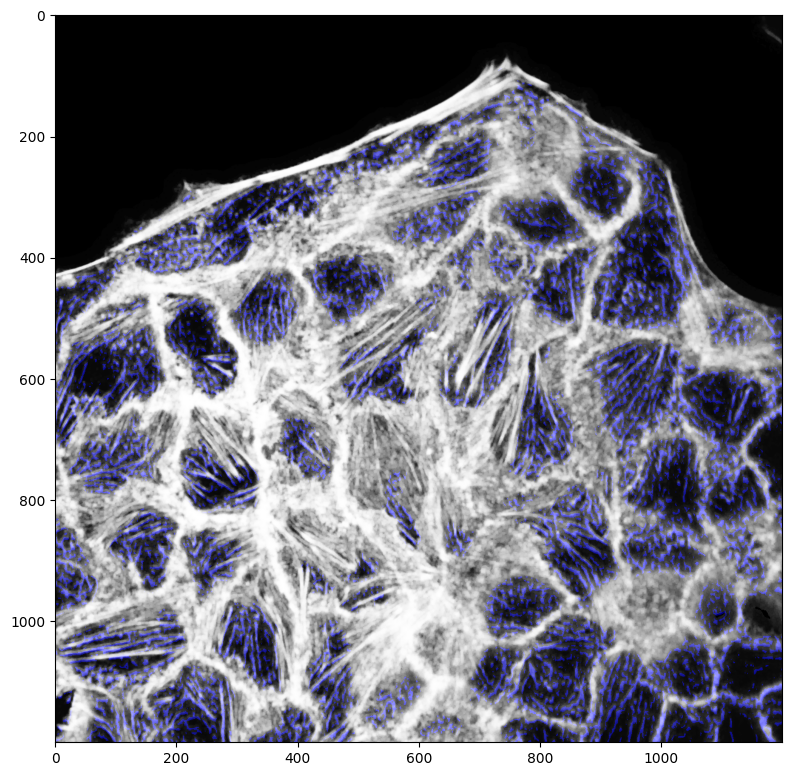

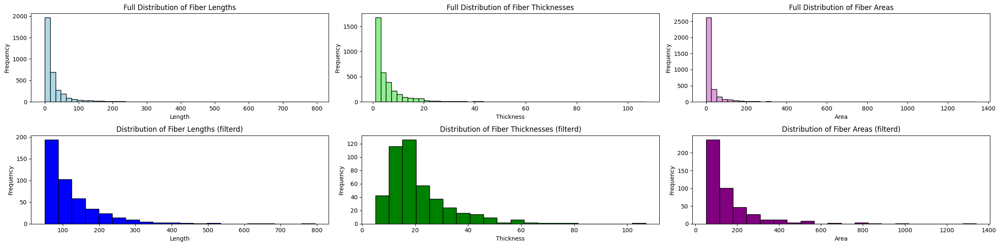

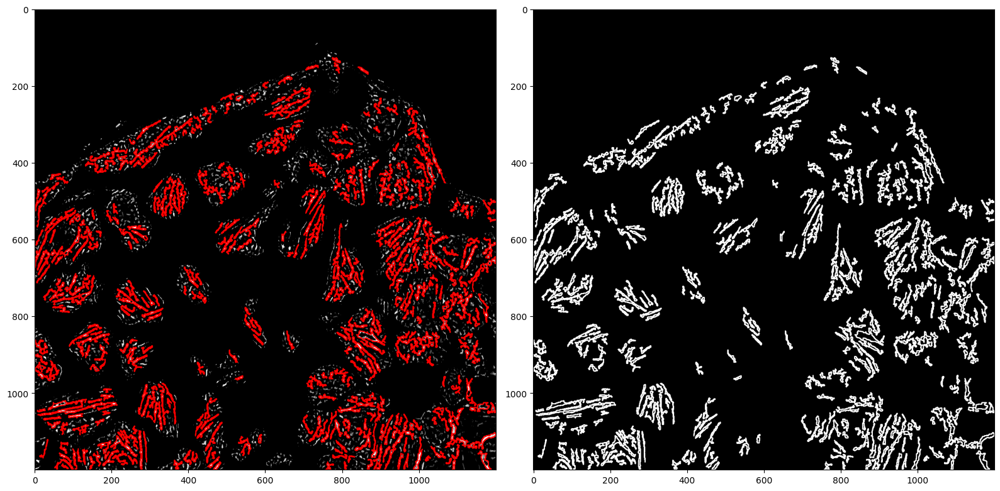

     ContourIndex      Length  Thickness   Area
0               0   52.870057         14   51.5
1               1   87.355338         21  108.5
2               2   63.941125         20  120.0
3               3   70.284271         17   57.0
4               4   52.142135          8   59.0
..            ...         ...        ...    ...
450           450  120.568542         22  156.0
451           451   73.012193         20  109.5
452           452   87.355338         14  117.5
453           453   89.355338         15   96.5
454           454   71.698484         15  106.5

[455 rows x 4 columns]


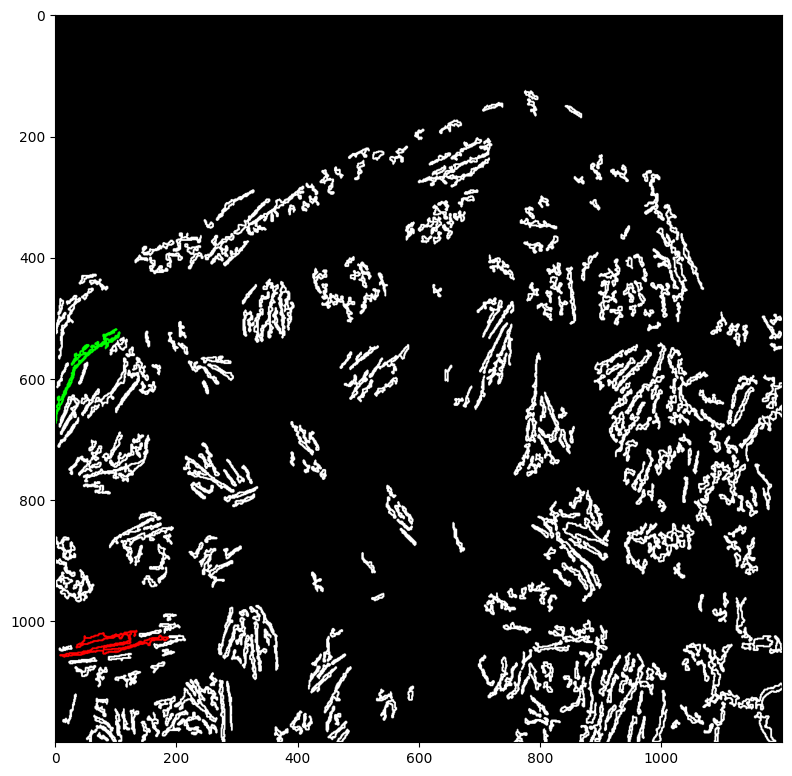

Longest Fiber Length (red): 794.8010774850845
Thickest Fiber (green): 107
Average Length of Fibers: 126.3662874680299
Average Thickness of Fibers: 21.553846153846155


In [36]:
gamma_values = [0.5, 1.5, 2, 3]
gaussian_vals = (7, 0)
thresh_val = 80
max_val = 60
min_cell_len = 50
morph_sizes = [(5, 7), (5, 9)]
bw_morph_enhance = (3, 10)
run("pic1.TIF", [2] ,gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance)

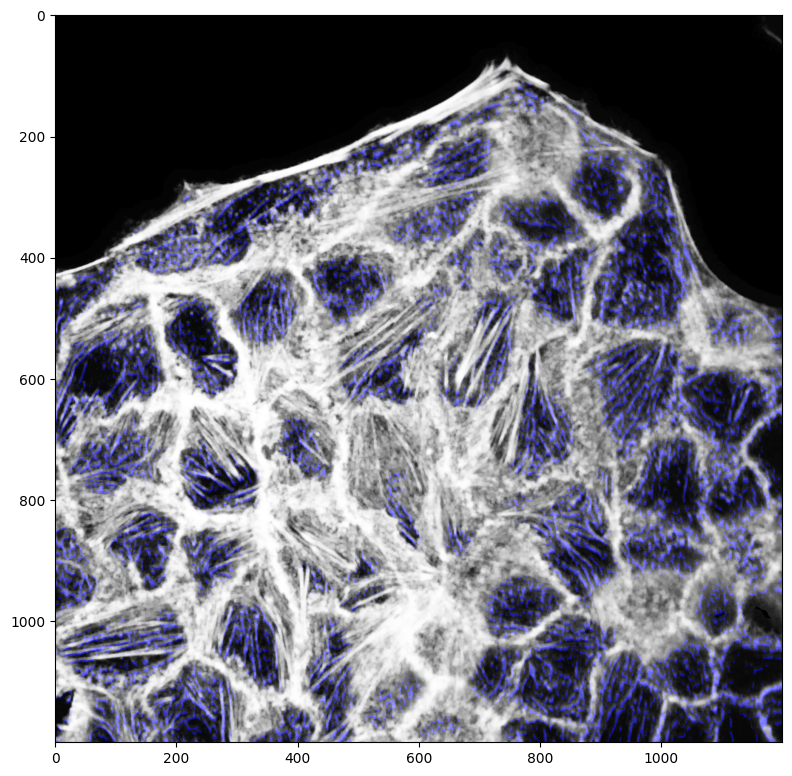

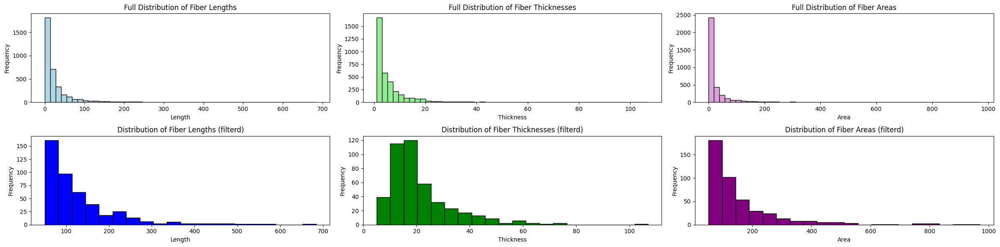

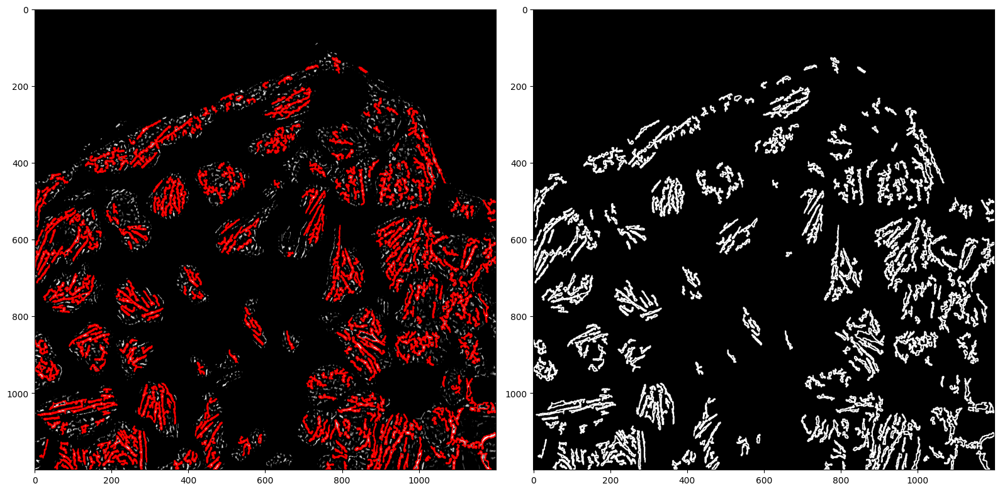

     ContourIndex      Length  Thickness   Area
0               0   52.870057         14   51.5
1               1   63.941125         20  116.0
2               2   87.355338         21  108.5
3               3   70.284271         17   57.0
4               4   52.142135          8   60.0
..            ...         ...        ...    ...
435           435  121.154328         22  152.5
436           436   69.012193         16   66.5
437           437   84.769552         14  114.0
438           438   89.355338         15   95.5
439           439   71.698484         15  106.5

[440 rows x 4 columns]


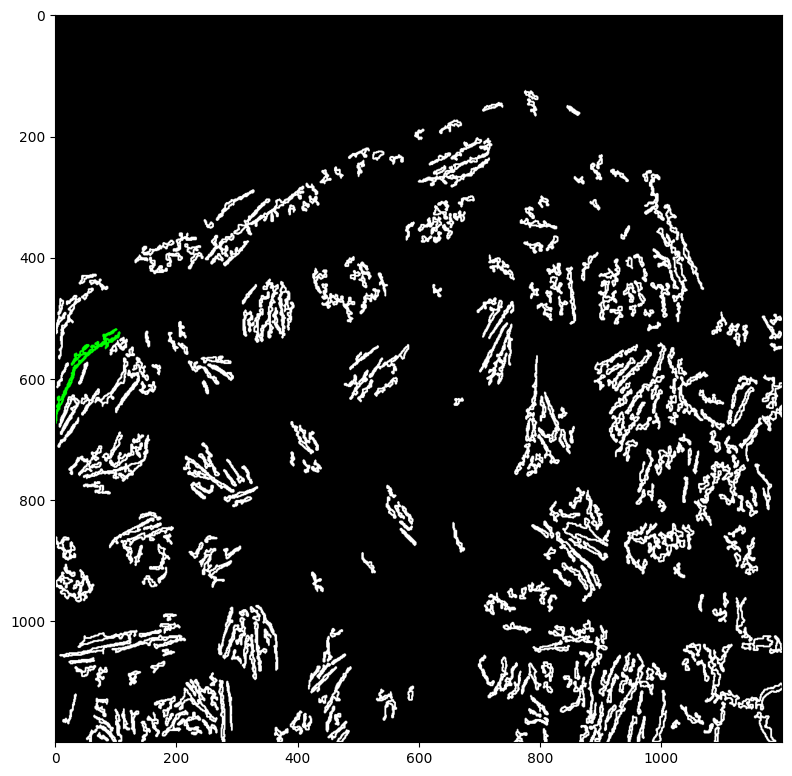

Longest Fiber Length (red): 684.2396762371063
Thickest Fiber (green): 107
Average Length of Fibers: 126.68411334671758
Average Thickness of Fibers: 21.65


In [35]:
gamma_values = [0.5, 1.5, 2, 3]
gaussian_vals = (7, 0)
thresh_val = 80
max_val = 60
min_cell_len = 50
morph_sizes = [(5, 7)]
bw_morph_enhance = (3, 10)
run("pic1.TIF",[2], gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance)

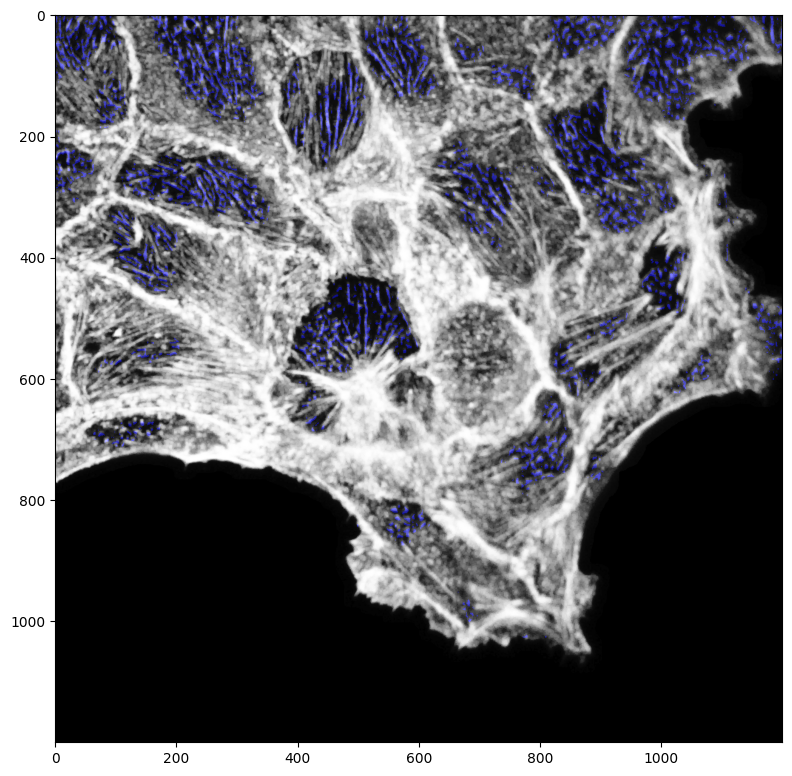

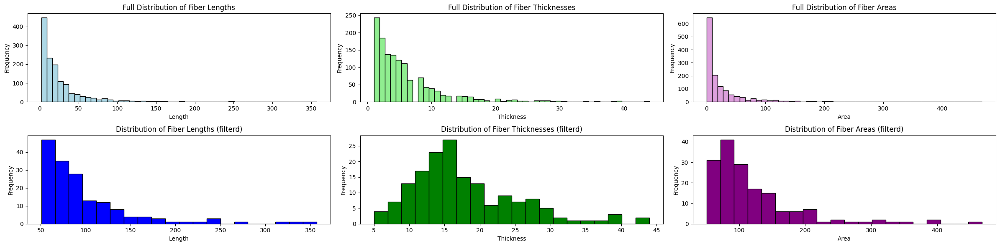

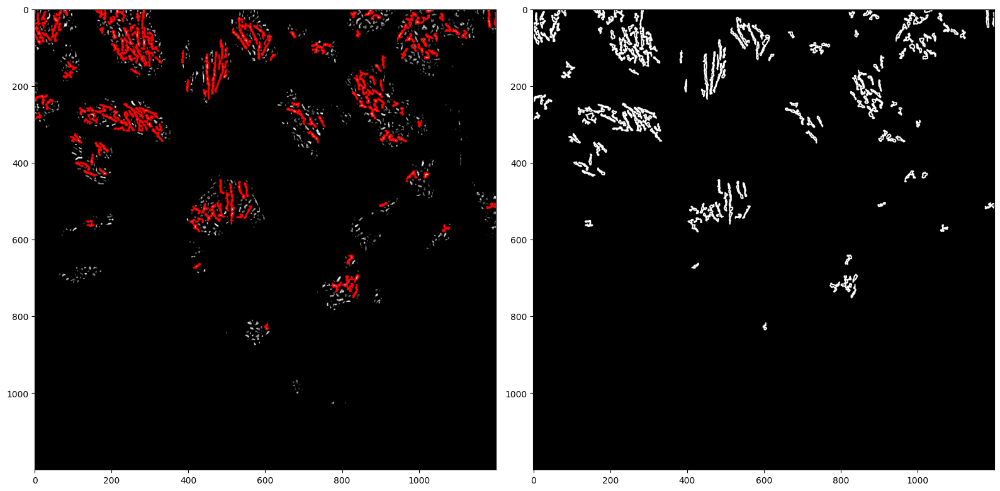

     ContourIndex      Length  Thickness   Area
0               0   52.970562         10   58.0
1               1   85.355338         13   72.5
2               2  106.568542         26  165.0
3               3  212.509666         28  279.0
4               4   54.041630         12   86.5
..            ...         ...        ...    ...
159           159  154.911687         26  180.0
160           160   69.213203          8   85.5
161           161  106.526911         20  122.5
162           162   52.970562         12  100.0
163           163   59.213203         14   76.5

[164 rows x 4 columns]


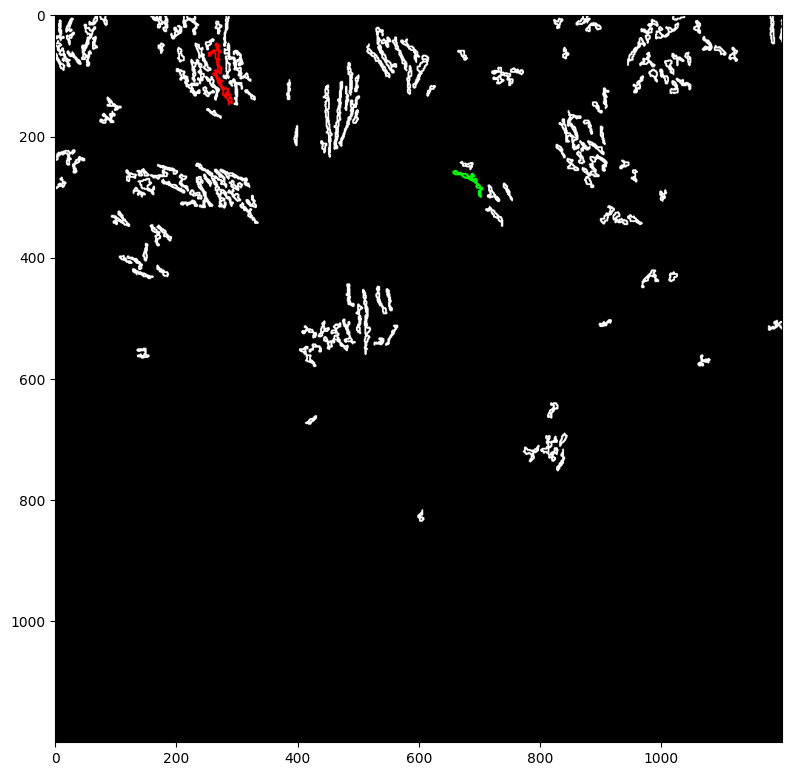

Longest Fiber Length (red): 357.22034335136414
Thickest Fiber (green): 44
Average Length of Fibers: 97.4930205134357
Average Thickness of Fibers: 17.75609756097561


In [38]:
# 2
gaussian_vals = (13, 0)
thresh_val = 60
max_val = 60
min_cell_len = 50
morph_sizes = (5, 10)
bw_morph_enhance = (4, 11)
run("pic2.TIF", [2], gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance)

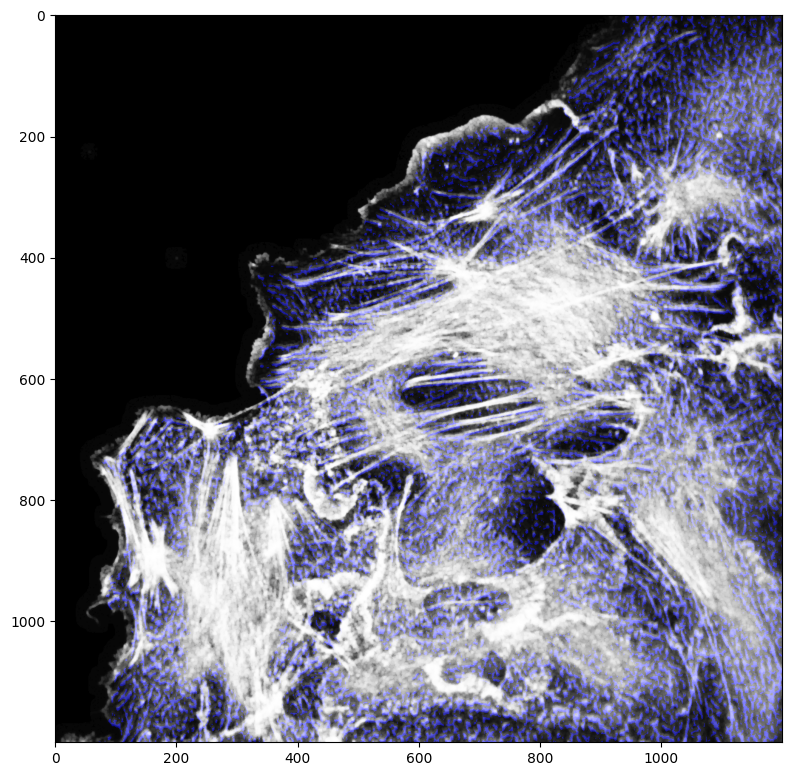

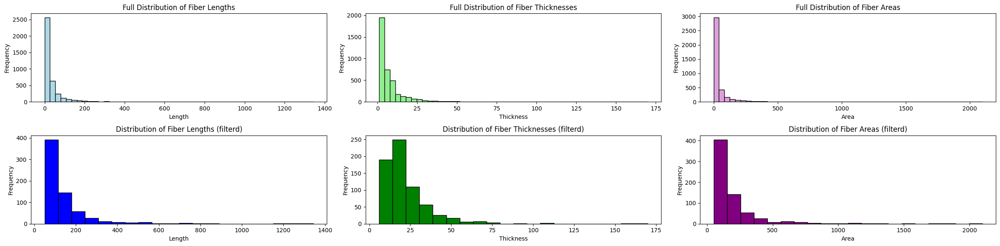

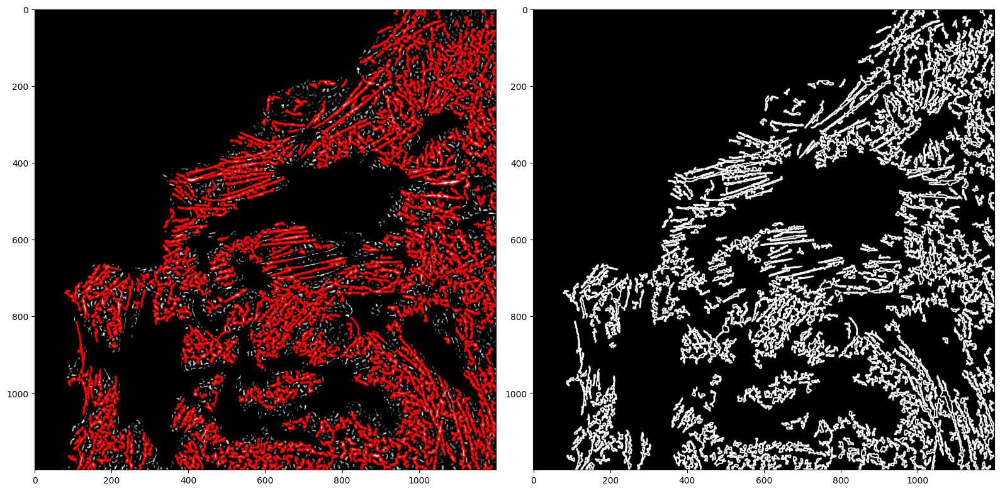

     ContourIndex      Length  Thickness   Area
0               0   52.384776         13   73.5
1               1   60.041630         18   72.5
2               2   56.627417          9   51.0
3               3  106.568542         19  146.0
4               4   57.798990         11   83.0
..            ...         ...        ...    ...
662           662   72.284271         14   69.0
663           663   74.526911         15   83.5
664           664   90.769552         18   88.0
665           665  116.083260         22  148.0
666           666   51.556349         11   54.5

[667 rows x 4 columns]


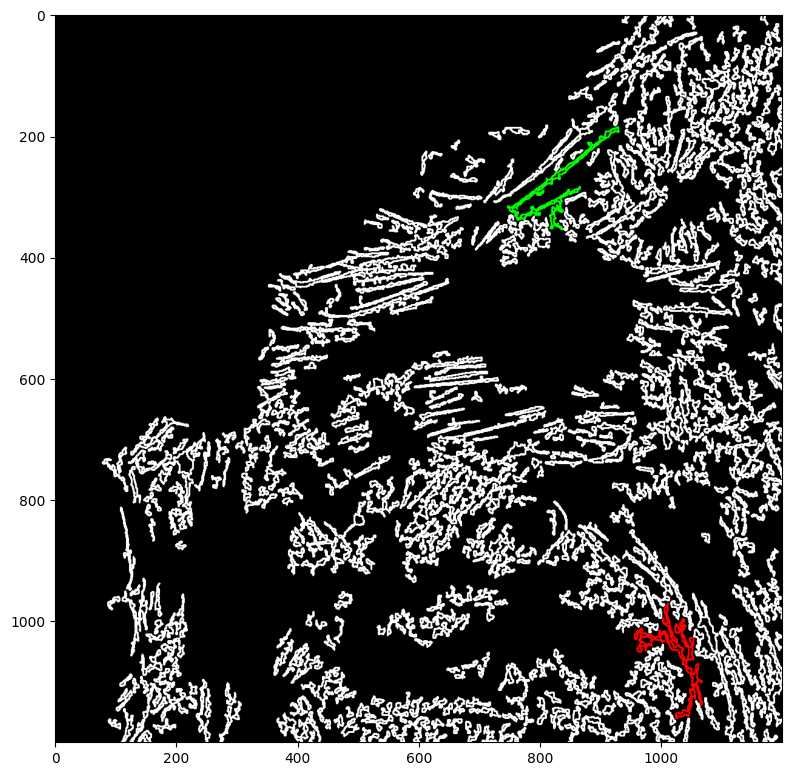

Longest Fiber Length (red): 1343.7442903518677
Thickest Fiber (green): 170
Average Length of Fibers: 142.7107167143872
Average Thickness of Fibers: 22.524737631184408


In [39]:
# 3
gaussian_vals = (7, 0)
thresh_val = 150
max_val = 60
min_cell_len = 80
morph_sizes = (3, 7)
bw_morph_enhance = (4, 11)
run("pic3.TIF", [2], gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance)

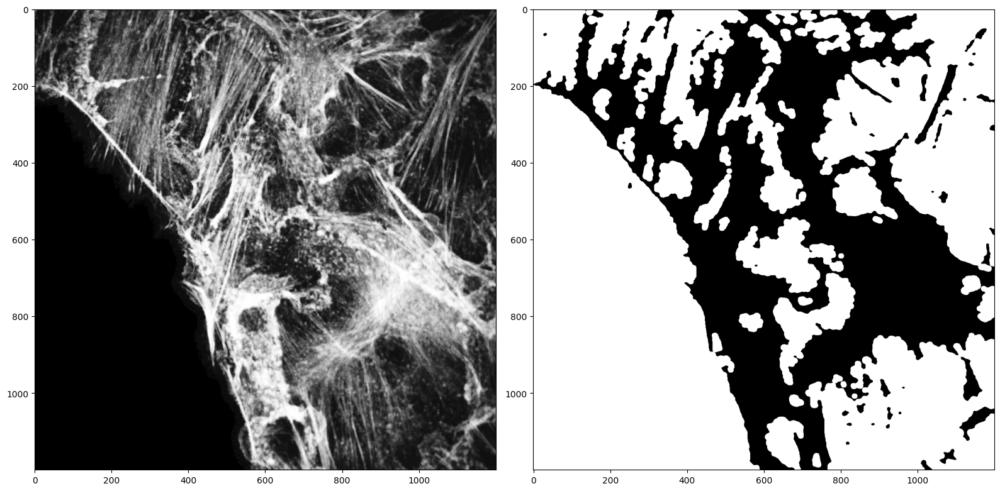

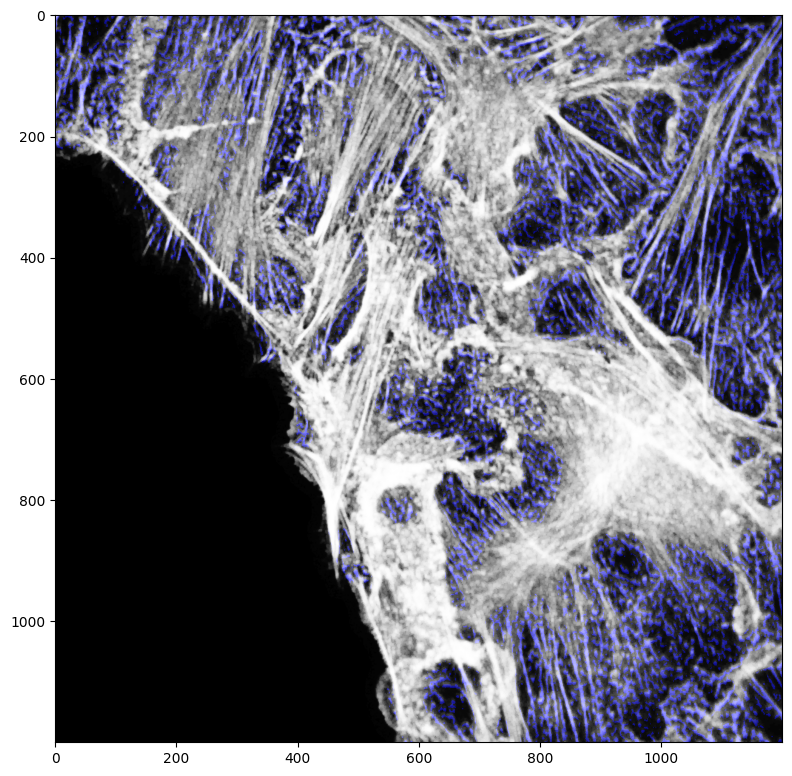

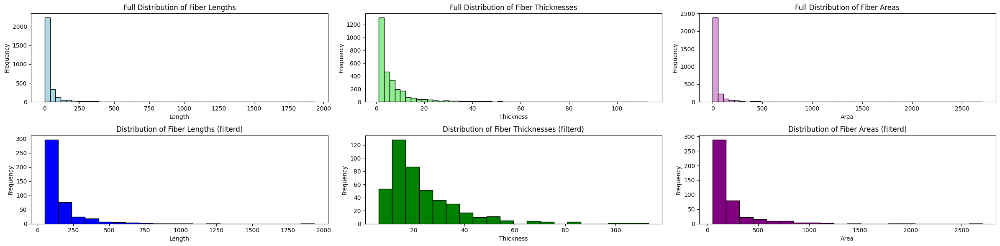

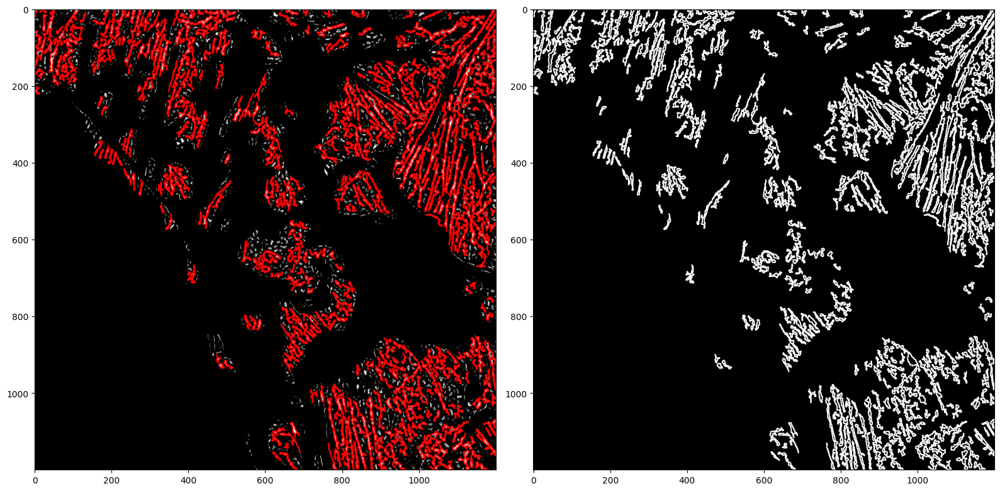

     ContourIndex      Length  Thickness   Area
0               0  109.254833         21  184.0
1               1   74.284271         10  121.0
2               2  218.166521         41  306.0
3               3  164.367531         46  210.0
4               4   74.526911         22   79.5
..            ...         ...        ...    ...
436           436  184.710677         42  246.0
437           437  194.509666         36  308.0
438           438  238.024385         21  431.0
439           439   58.970562         12   73.0
440           440   54.727922          7   62.5

[441 rows x 4 columns]


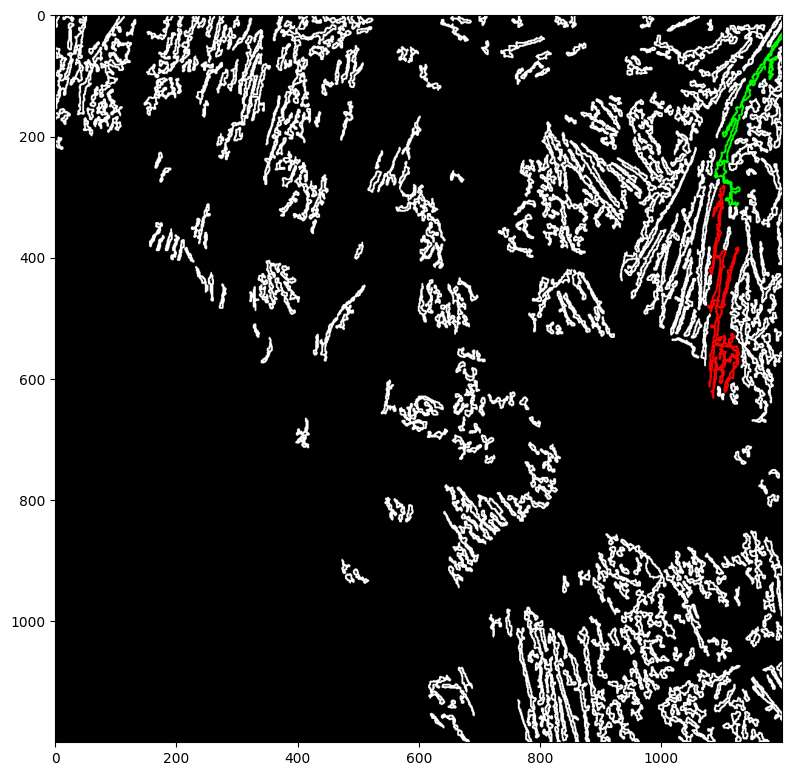

Longest Fiber Length (red): 1934.1778367757797
Thickest Fiber (green): 113
Average Length of Fibers: 159.2645001322234
Average Thickness of Fibers: 23.6984126984127


In [40]:
# 4
gaussian_vals = (7, 0)
thresh_val = 80
max_val = 60
min_cell_len = 30
morph_sizes = (5, 13)
bw_morph_enhance = (5, 15)
run("pic4.TIF", [2],gaussian_vals, thresh_val, max_val, morph_sizes, min_cell_len,
                            bw_morph_enhance, show_morph=True)